# Image-Based Lighting

## Recovering HDR Radiance Maps


In [1]:
# System imports
from os import path
import math

# Third-Party Imports
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata

# local imports
from utils.io import read_image, write_image, read_hdr_image, write_hdr_image
from utils.display import display_hdr_image_linear, display_hdr_image, display_log_irradiances
from utils.hdr_helpers import gsolve
#from utils.hdr_helpers import get_equirectangular_image
from utils.bilateral_filter import bilateral_filter
from utils.meta import TODO

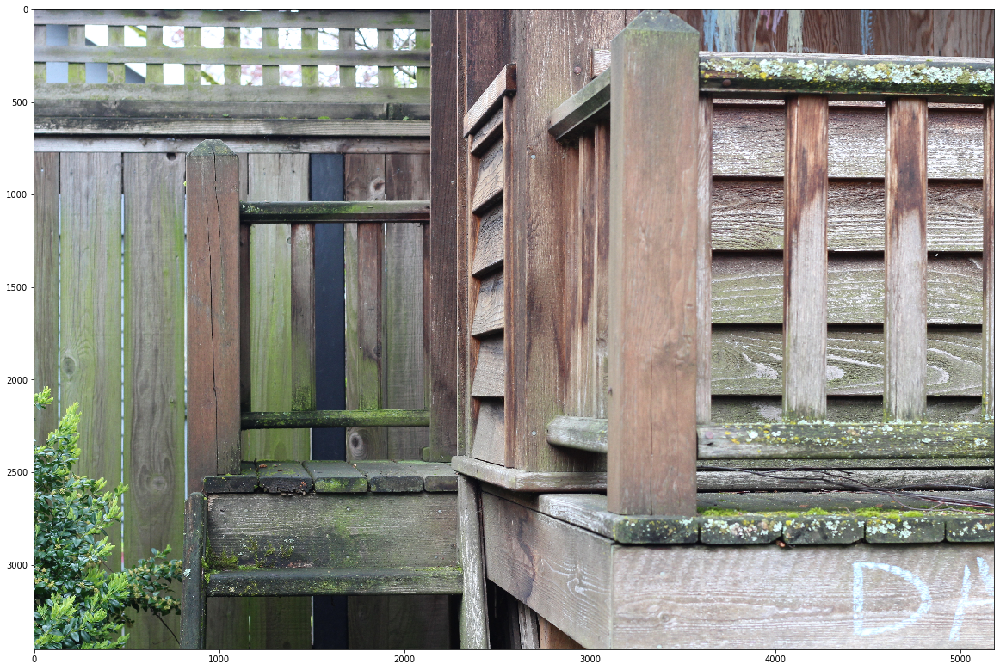

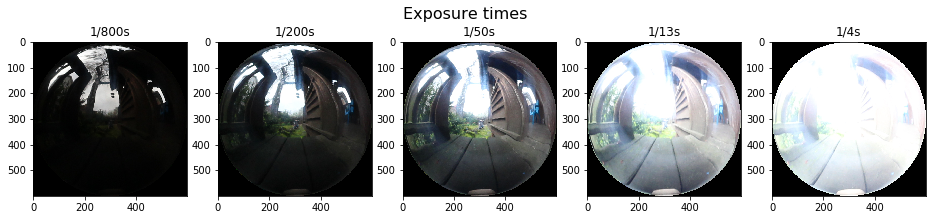

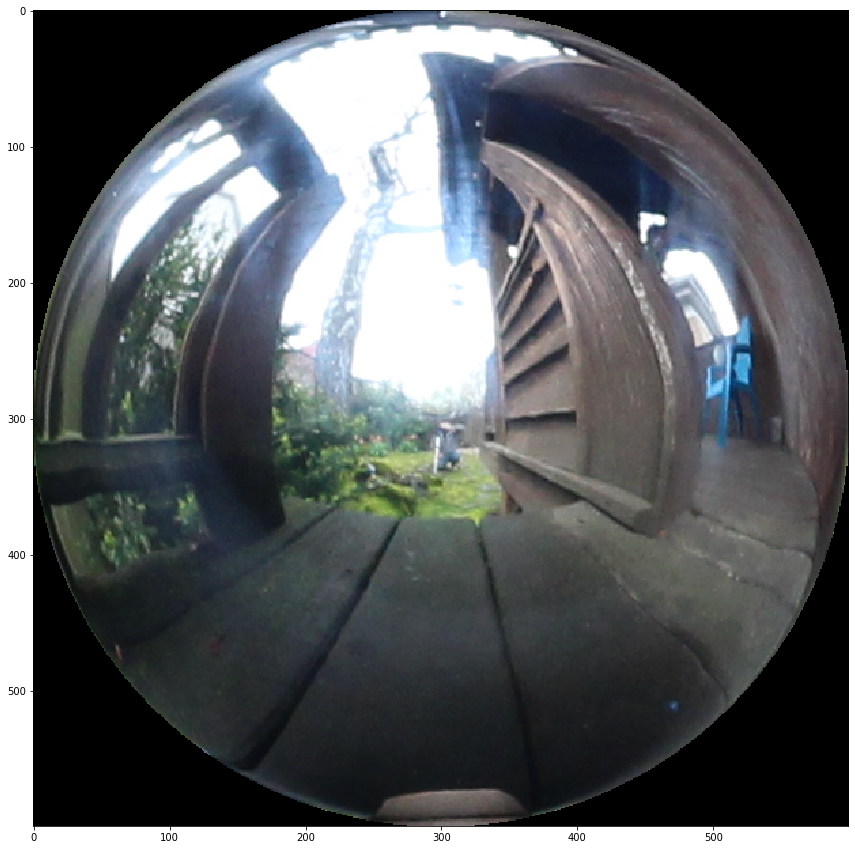

In [3]:
background_image_file = "./bryanmg2_images/background_1-50.JPG"

sphere_files = ["./bryanmg2_images/probe_1-800.png",
                "./bryanmg2_images/probe_1-200.png",
                "./bryanmg2_images/probe_1-50.png",
                "./bryanmg2_images/probe_1-13.png",
                "./bryanmg2_images/probe_1-4.png"]



background_image = read_image(background_image_file)

plt.figure(figsize = (20,20))
plt.imshow(background_image)
plt.show()


ldr_images = np.stack([read_image(f) for f in sphere_files])
exposures = ["1/" + t for t in ["800", "200", "50", "13", "4"]]

fig, axes = plt.subplots(1,len(ldr_images), figsize = (16,3.25))
for i in range(len(ldr_images)):
    axes[i].set_title(str(exposures[i]) + 's')
    axes[i].imshow(ldr_images[i])
fig.suptitle('Exposure times', fontsize=16)
plt.show()


plt.figure(figsize = (15,15))
plt.imshow(ldr_images[2])
plt.show()


### Naive LDR merging

In [4]:
def make_hdr_naive(ldr_images: np.ndarray, exposures: list) -> (np.ndarray, np.ndarray):
    '''
    Makes HDR image using multiple LDR images, and its corresponding exposure values.
    
    The steps to implement:
    1) Divide each images by its exposure time.
        - This will rescale images as if it has been exposed for 1 second.
    
    2) Return average of above images
    
    
    For further explanation, please refer to problem page for how to do it.
      
    Args:
        ldr_images(np.ndarray): N x H x W x 3 shaped numpy array representing
            N ldr images with width W, height H, and channel size of 3 (RGB)
        exposures(list): list of length N, representing exposures of each images.
            Each exposure should correspond to LDR images' exposure value.
    Return:
        (np.ndarray): H x W x 3 shaped numpy array representing HDR image merged using
            naive ldr merging implementation.
        (np.ndarray): N x H x W x 3 shaped numpy array represending log irradiances
            for each exposures
            
    '''
    N, H, W, C = ldr_images.shape
    # sanity check
    assert N == len(exposures)

    hdr_image = np.zeros((H,W,C), np.float32)
    log_irradiances = np.zeros((N,H,W,C), np.float32)

    for y in range(H):
        for x in range(W):
            for color in range(C):
                color_tally = 0

                for image in range(N):
                    color_tally += ldr_images[image][y][x][color] / exposures[image]

                hdr_image[y][x][color] = color_tally / N

    ldr_images[ldr_images==0.0] = np.float32(1)/np.float32(256)
    
    log_irradiances = np.array([np.log(x) - np.log(exposures[i]) for i,x in enumerate(ldr_images)])
    
    return hdr_image, log_irradiances


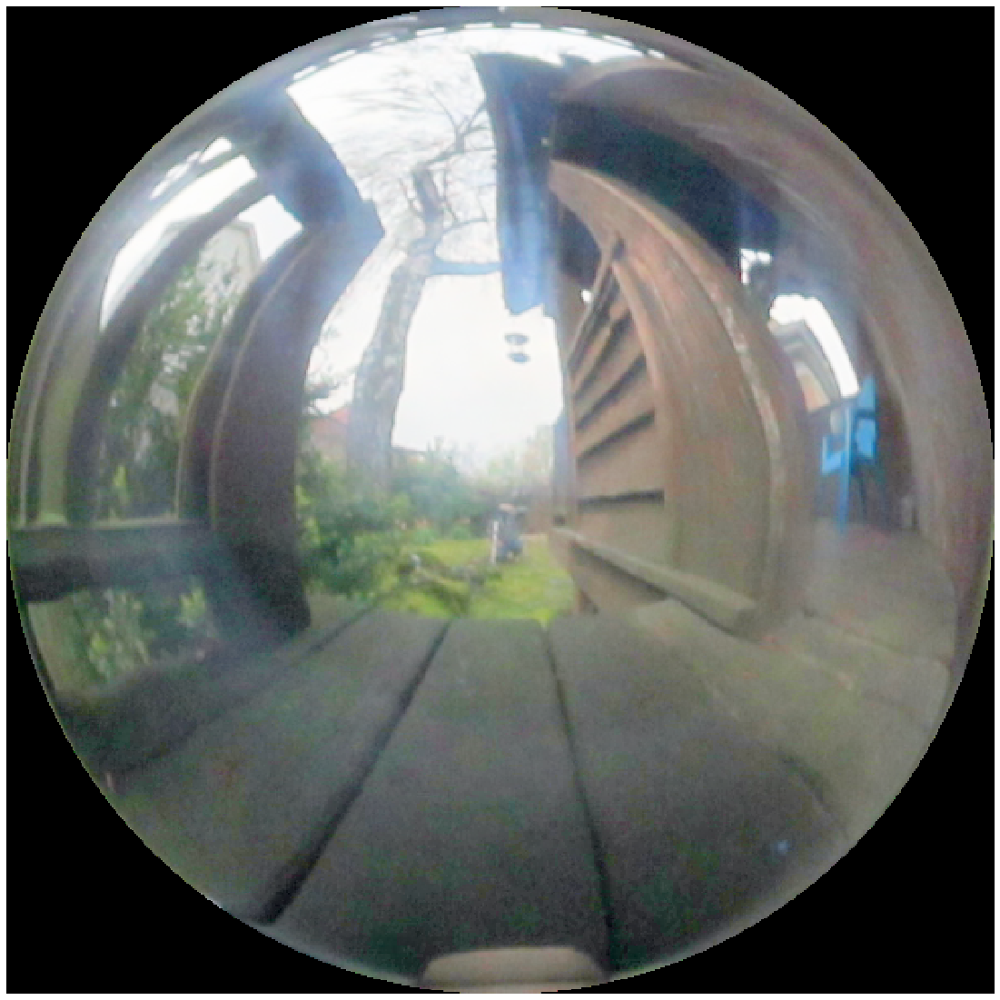

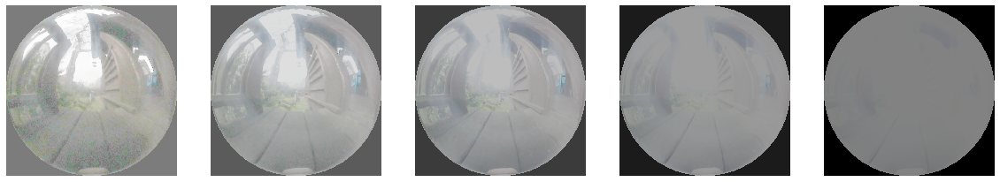

In [5]:
# Reloading files to avoid problems I created in other sections of code...
sphere_files = ["./bryanmg2_images/probe_1-800.png",
                "./bryanmg2_images/probe_1-200.png",
                "./bryanmg2_images/probe_1-50.png",
                "./bryanmg2_images/probe_1-13.png",
                "./bryanmg2_images/probe_1-4.png"]

ldr_images = np.stack([read_image(f) for f in sphere_files])

exposures = np.float32([1. / t for t in [800, 200, 50, 13, 4]])

# get HDR image, log irradiance
naive_hdr_image, naive_log_irradiances = make_hdr_naive(ldr_images, exposures)

# write HDR image to directory
write_hdr_image(naive_hdr_image, 'images/outputs/naive_hdr.hdr')

# display HDR image
display_hdr_image(naive_hdr_image)

# display log irradiance image
display_log_irradiances(naive_log_irradiances)


### LDR merging without under- and over-exposed regions

In [5]:
#w = lambda z: float(128-abs(z-128))

def make_hdr_filtered(ldr_images: np.ndarray, exposures: list) -> (np.ndarray, np.ndarray):
    '''
    Makes HDR image using multiple LDR images, and its corresponding exposure values.
    Please refer to problem notebook for how to do it.
    
    The steps to implement:
    1) compute weights for images with based on intensities for each exposures
        - This can be a binary mask to exclude low / high intensity values

    2) Divide each images by its exposure time.
        - This will rescale images as if it has been exposed for 1 second.
    
    3) Return weighted average of above images
    
    
    Args:
        ldr_images(np.ndarray): N x H x W x 3 shaped numpy array representing
            N ldr images with width W, height H, and channel size of 3 (RGB)
        exposures(list): list of length N, representing exposures of each images.
            Each exposure should correspond to LDR images' exposure value.
    Return:
        (np.ndarray): H x W x 3 shaped numpy array representing HDR image merged without
            under - over exposed regions
        (np.ndarray): N x H x W x 3 shaped numpy array represending log irradiances
            for each exposures
    '''
    N, H, W, C = ldr_images.shape
    # sanity check
    assert N == len(exposures)
    
    hdr_image = np.zeros((H,W,C), np.float32)
    log_irradiances = np.zeros((H,W,C), np.float32)

    for y in range(H):
        for x in range(W):
            for color in range(C):
                color_tally = 0
                color_count = 0
                for image in range(N):
                    color_value = ldr_images[image][y][x][color] / exposures[image]
                    if (color_value > 0.02) and (color_value < 0.98):
                        color_tally += color_value
                        color_count += 1

                if color_count > 0:
                    color_tally = color_tally / color_count
                else:
                    for image in range(N):
                        color_tally += ldr_images[image][y][x][color] / exposures[image]
                    color_tally = color_tally / N

                hdr_image[y][x][color] = color_tally
                        

    ldr_images[ldr_images==0.0] = np.float32(1)/np.float32(256)
    log_irradiances = np.array([np.log(x) - np.log(exposures[i]) for i,x in enumerate(ldr_images)])

    
    return hdr_image, log_irradiances


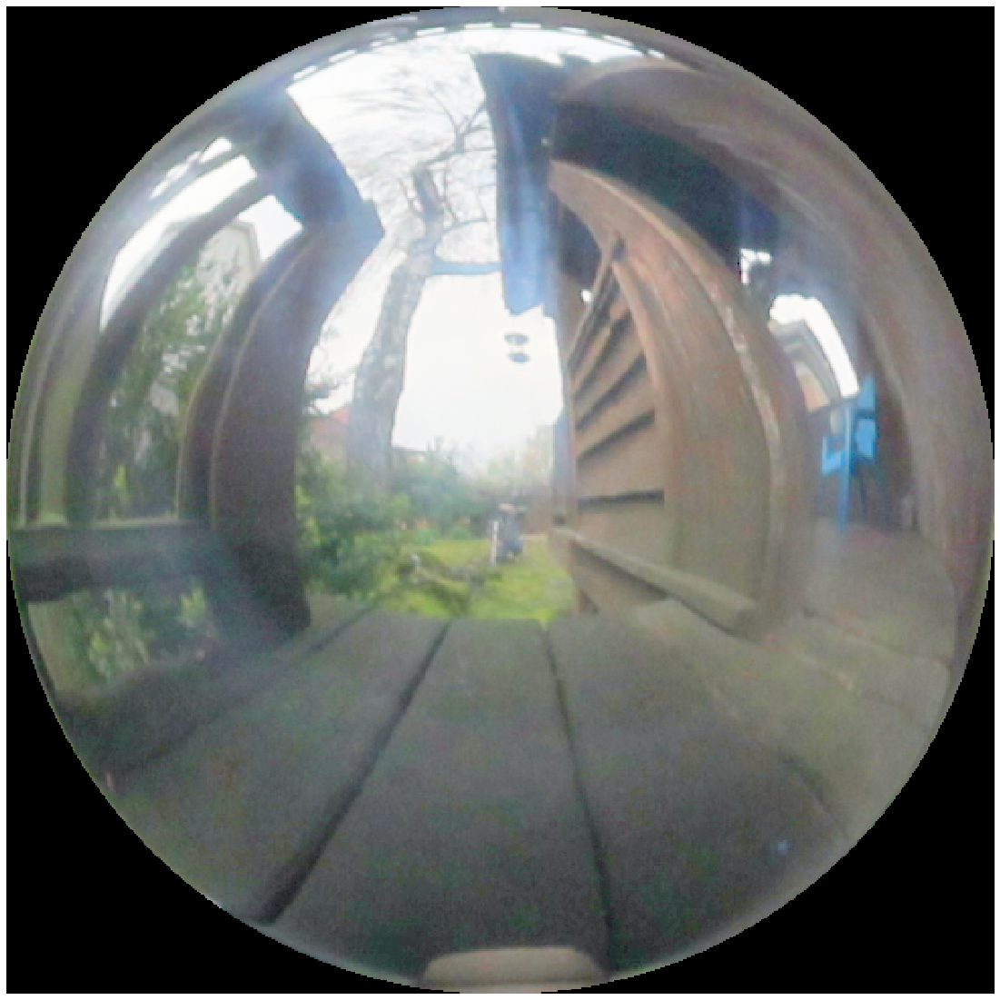

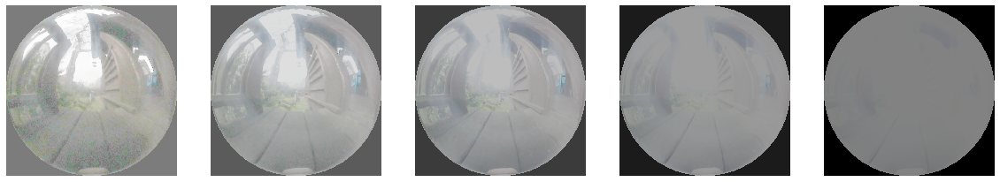

In [6]:
# Reloading files to avoid problems I created in other sections of code...

sphere_files = ["./bryanmg2_images/probe_1-800.png",
                "./bryanmg2_images/probe_1-200.png",
                "./bryanmg2_images/probe_1-50.png",
                "./bryanmg2_images/probe_1-13.png",
                "./bryanmg2_images/probe_1-4.png"]

ldr_images = np.stack([read_image(f) for f in sphere_files])

exposures = np.float32([1. / t for t in [800, 200, 50, 13, 4]])

# get HDR image, log irradiance
filtered_hdr_image, filtered_log_irradiances = make_hdr_filtered(ldr_images, exposures)

# write HDR image to directory
write_hdr_image(filtered_hdr_image, 'images/outputs/filtered_hdr.hdr')

# display HDR image
display_hdr_image(filtered_hdr_image)

# display log irradiance image
display_log_irradiances(naive_log_irradiances)


### LDR merging and response function estimation

In [2]:
def make_hdr_estimation(ldr_images: np.ndarray, exposures: list)-> (np.ndarray, np.ndarray):
    '''
    Makes HDR image using multiple LDR images, and its corresponding exposure values.
    Please refer to problem notebook for how to do it.
    
    **IMPORTANT**
    The gsolve operations should be ran with:
        Z: int64 array of shape N x P, where N = number of images, P = number of pixels
        B: float32 array of shape N,
        l: Number
        W: function that takes int and returns float
    
    The steps to implement:
    1) Create random points to sample (from mirror ball region)
    2) For each exposures, compute g values using samples
    3) Recover HDR image using g values
    

    Args:
        ldr_images(np.ndarray): N x H x W x 3 shaped numpy array representing
            N ldr images with width W, height H, and channel size of 3 (RGB)
        exposures(list): list of length N, representing exposures of each images.
            Each exposure should correspond to LDR images' exposure value.
    Return:
        (np.ndarray): H x W x 3 shaped numpy array representing HDR image merged using
            gsolve
        (np.ndarray): N x H x W x 3 shaped numpy array represending log irradiances
            for each exposures
        (np.ndarray): 3 x 256 shaped numpy array represending g values of each pixel intensities
            at each channels (used for plotting)
    '''
    N, H, W, C = ldr_images.shape
    # sanity check
    assert N == len(exposures)
        
    ldr_asint8 = (ldr_images.copy()*255.0).astype('uint8')
    
    calibration = cv2.createCalibrateDebevec()
    response = calibration.process(ldr_asint8, exposures)
    merge = cv2.createMergeDebevec()
    
    hdr_image = merge.process(ldr_asint8, exposures, response)

    g_per_exposures = np.array([response[:,:,0].flatten(),
                                response[:,:,1].flatten(),
                                response[:,:,2].flatten()])

    ldr_images[ldr_images==0.0] = np.float32(1)/np.float32(256)
    
    log_irradiances = np.array([np.log(x) - np.log(exposures[i]) for i,x in enumerate(ldr_images)])
    
    for image in range(N):
        for y in range(H):
            for x in range(W):
                for color in range(C):
                    candidate = (ldr_images[image][y][x][color] * 255.0).astype('uint8')
                    log_irradiances[image][y][x][color] = np.log(g_per_exposures[color][candidate])

                


    return hdr_image, log_irradiances, g_per_exposures


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


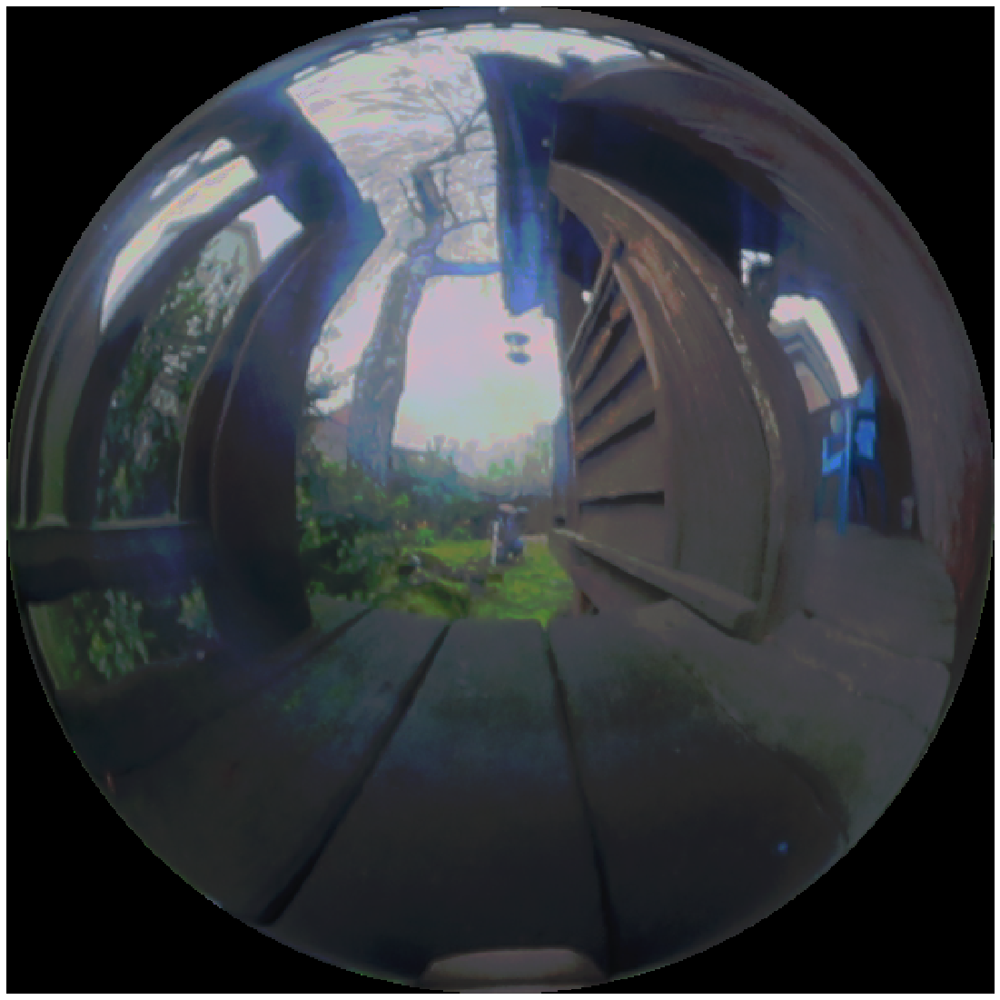

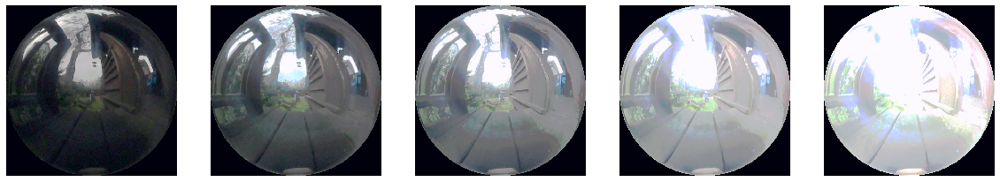

In [21]:
# Reloading files to avoid problems I created in other sections of code...

sphere_files = ["./bryanmg2_images/probe_1-800.png",
                "./bryanmg2_images/probe_1-200.png",
                "./bryanmg2_images/probe_1-50.png",
                "./bryanmg2_images/probe_1-13.png",
                "./bryanmg2_images/probe_1-4.png"]

ldr_images = np.stack([read_image(f) for f in sphere_files])

exposures = np.float32([1. / t for t in [800, 200, 50, 13, 4]])

# get HDR image, log irradiance
estimated_hdr_image, estimated_log_irradiance, estimated_g = make_hdr_estimation(ldr_images, exposures)

#print(estimated_g)

# write HDR image to directory
write_hdr_image(estimated_hdr_image, 'images/outputs/estimated_hdr.hdr')

# display HDR image
display_hdr_image(estimated_hdr_image)

# display log irradiance image
display_log_irradiances(estimated_log_irradiance)

(3, 256)


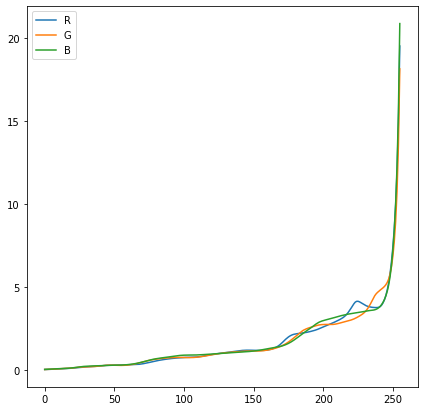

In [18]:
# display G function for each intensity values
print(estimated_g.shape)
N, NG = estimated_g.shape
labels = ['R', 'G', 'B']
plt.figure(figsize = (7,7))
for n in range(N):
    plt.plot(range(NG), estimated_g[n], label=labels[n])
plt.gca().legend(('R', 'G', 'B'))

## Panoramic transformations

In [6]:
hdr_mirrorball_image = read_hdr_image('images/outputs/estimated_hdr.hdr')

def get_equirectangular_image(reflection_vector, hdr_image):
    '''
    Given a set of Reflection Vectors for all the pixels in the image
    along with the HDR image saved from the previous part, this function 
    returns the equirectangular image for the environment map that can be
    directly used in Blender for the next part.
    
    Arguments:
        reflection_vector: H x W x 3 array containing the reflection vector at each pixel across the three dimensions
        hdr_image: the LDR merged image from the previous part
    
    Returns:
        equirectangular_image: This is the equirectangular environment map that is to be used in the next part.
    '''
    
    H, W, C = hdr_image.shape
    rv_x, rv_y, rv_z = np.split(reflection_vector, 3, axis = 2)
    
    theta_ball = math.pi - np.arccos(rv_y)
    phi_ball = np.arctan2(rv_z, rv_x)
    phi_ball[phi_ball != phi_ball] = 0
    phi_ball += 3*math.pi/2
    phi_ball %= 2*math.pi
  
    phi_theta_image = np.zeros((H, W, C))
    phi_theta_image[:,:,0] = phi_ball[:,:,0]/(2*math.pi)
    phi_theta_image[:,:,1] = theta_ball[:,:,0]/math.pi

    plt.imshow(phi_theta_image)
    plt.show()

    EH, EW = 360, 720
    phi_1st_half = np.arange(math.pi, 2*math.pi, math.pi / (EW//2))
    phi_2nd_half = np.arange(0*math.pi, math.pi, math.pi / (EW//2))
    
    theta_range = np.arange(0, math.pi, math.pi/EH)
    phi_ranges = np.concatenate((phi_1st_half, phi_2nd_half))
    phis, thetas = np.meshgrid(phi_ranges, theta_range)


    
    spherical_coord = np.concatenate((phi_ball, theta_ball), axis = 2).reshape(-1, 2)
    spherical_vals = hdr_image.reshape(-1, 3)
    equirectangular_coord = np.stack((phis, thetas), axis = 2).reshape(-1, 2)
    equirectangular_intensities = []
    for c in range(C):
        equirectangular_intensity = griddata(spherical_coord, spherical_vals[:,c], equirectangular_coord)
        equirectangular_intensities.append(equirectangular_intensity.reshape(EH, EW))
        equirectangular_image = np.stack(equirectangular_intensities, axis = 2)
    
    
    equirectangular_image[equirectangular_image != equirectangular_image] = equirectangular_image[equirectangular_image == equirectangular_image].mean()
    return equirectangular_image.astype(np.float32)


In [7]:
def panoramic_transform(hdr_image):
    '''
    Given HDR mirror ball image, 
    
    Expects mirror ball image to have center of the ball at center of the image, and
    width and height of the image to be equal.
    
    Steps to implement:
    1) Compute normal vector from mirror ball
    2) Compute reflection vector of mirror ball using given equation
    3) Map reflection vectors into spherical coordinates
    4) Interpolate spherical coordinate values into equirectangular grid.
      - hint: use scipy.interpolate.griddata


    '''
    H, W, C = hdr_image.shape
    assert H == W
    assert H % 2 == 0
    assert C == 3
    
    center = W // 2
    
    
    N = np.zeros((H, W, C))
    
    for i in range(H):
        for j in range(W):
            N[i,j,0] =  -(j - center) / center
            N[i,j,1] =  (i - center) / center

            if (np.square(N[i,j,0]) + np.square(N[i,j,1])) > 1:
                N[i,j,0] = 0
                N[i,j,1] = 0
            else:
                N[i,j,2] = np.sqrt(1 - (np.square(N[i,j,0]) + np.square(N[i,j,1])))

    plt.imshow(N)
    plt.show()


    V = np.array([0., 0., -1.])
    
    # R = V − 2 ∗ dot(V,N) ∗ N
    R = np.zeros((H, W, C))

    for i in range(H):
        for j in range(W):        
            dot = V[0] * N[i,j,0] + V[1] * N[i,j,1] + V[2] * N[i,j,2]
            R[i,j] = V - 2 * dot * N[i,j]

    plt.imshow(R)
    plt.show()
    
    return get_equirectangular_image(R, hdr_image)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


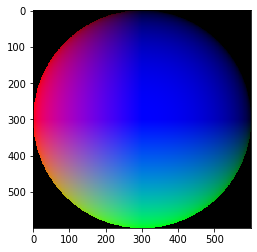

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


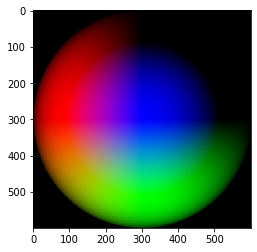

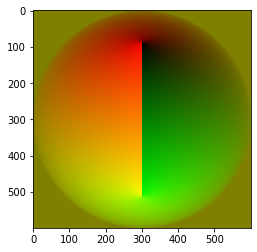

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


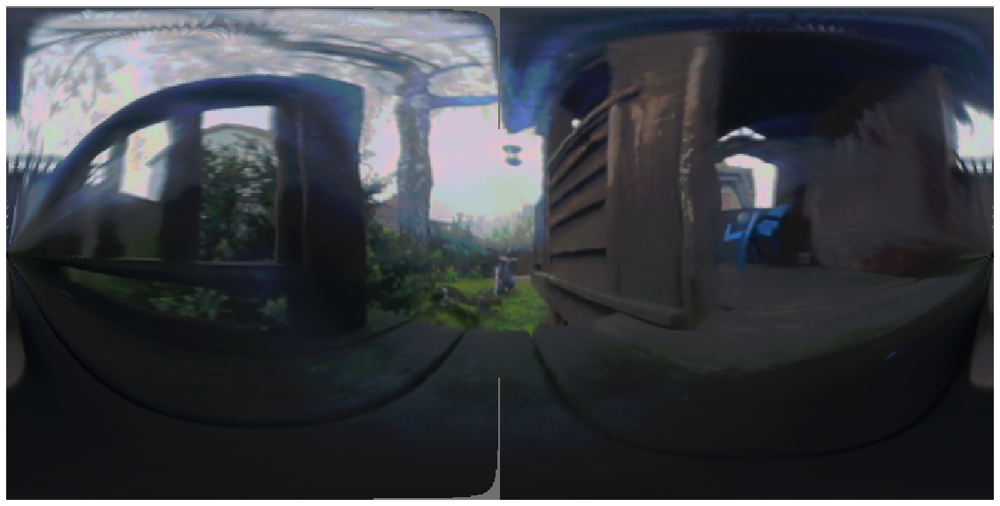

In [17]:

eq_image = panoramic_transform(estimated_hdr_image)
display_hdr_image(eq_image)
write_hdr_image(eq_image, 'images/outputs/equirectangular.hdr')


---

## Rendering synthetic objects into photographs


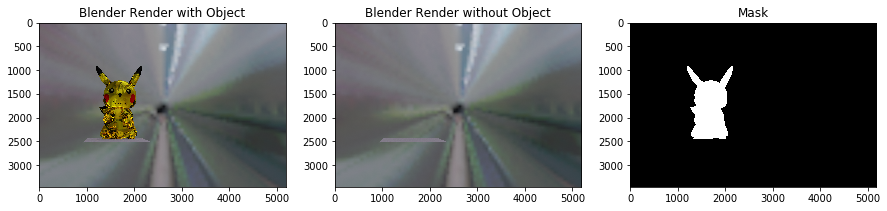

In [39]:
# this part assumes that you have these from Blender.
blender_output_with_object_path = "./bryanmg2_images/blender_output_with_object.png"
blender_output_without_object_path = "./bryanmg2_images/blender_output_without_object.png"
blender_output_mask_path = "./bryanmg2_images/blender_output_mask.png"

R = read_image(blender_output_with_object_path)
E = read_image(blender_output_without_object_path)
M = read_image(blender_output_mask_path)
M = M > 0.5
I = background_image

c = 0.005

fig, axes = plt.subplots(1,3, figsize = (15,15))
axes[0].set_title('Blender Render with Object')
axes[0].imshow(R)
axes[1].set_title('Blender Render without Object')
axes[1].imshow(E)
axes[2].set_title('Mask')
axes[2].imshow(M*255)

plt.show()


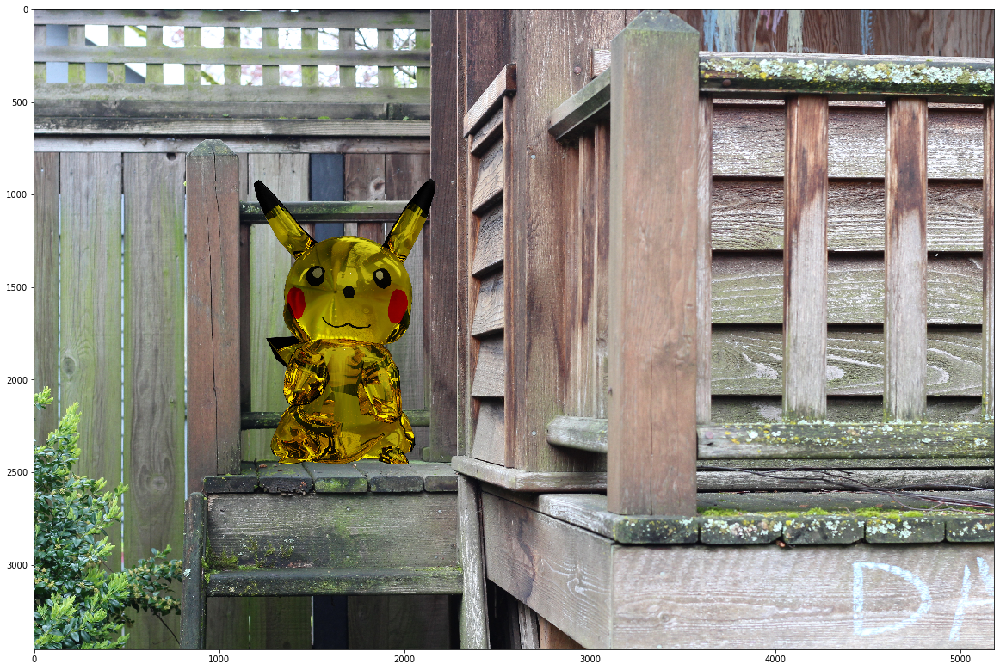

In [33]:
merged = M*R + (1-M)*I + (1-M)*(R-E)*c

plt.figure(figsize = (20,20))
plt.imshow(merged)
plt.show()


In [34]:
write_image(merged, 'images/outputs/merged.png')

---

## Additional Image-Based Lighting Result


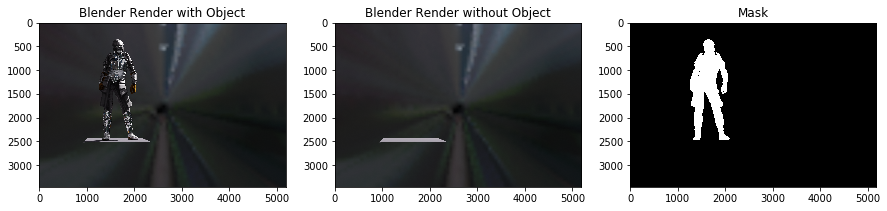

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


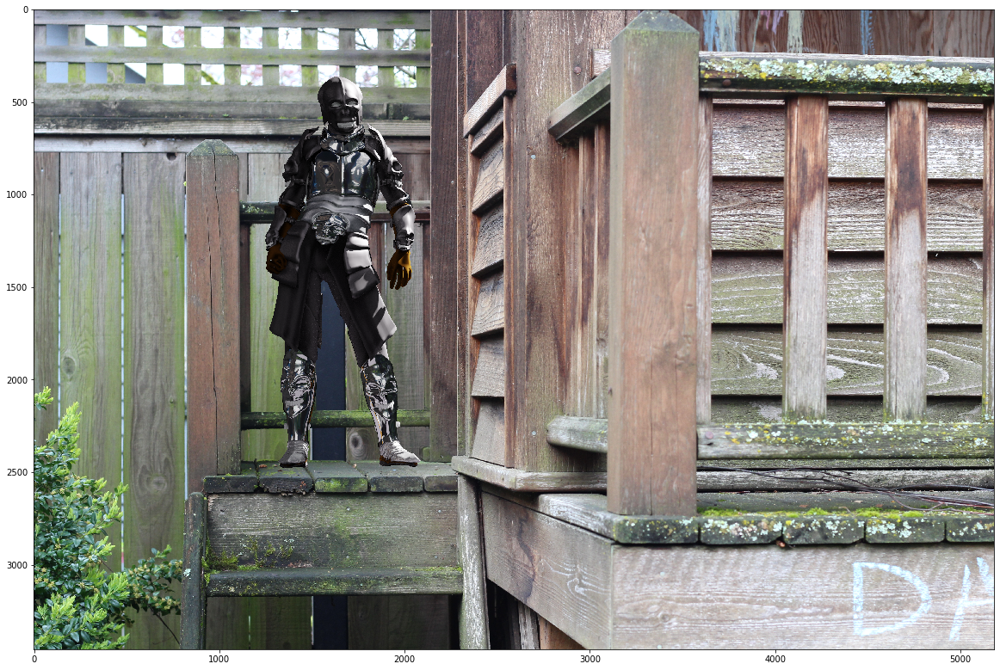

In [7]:
# this part assumes that you have these from Blender.
blender_knight_path = "./bryanmg2_images/blender_knight_object.png"
blender_knight_gone_path = "./bryanmg2_images/blender_knight_gone.png"
blender_knight_mask_path = "./bryanmg2_images/blender_knight_mask.png"

R = read_image(blender_knight_path)
E = read_image(blender_knight_gone_path)
M = read_image(blender_knight_mask_path)
M = M > 0.5
I = background_image

c = 0.005

fig, axes = plt.subplots(1,3, figsize = (15,15))
axes[0].set_title('Blender Render with Object')
axes[0].imshow(R)
axes[1].set_title('Blender Render without Object')
axes[1].imshow(E)
axes[2].set_title('Mask')
axes[2].imshow(M*255)

plt.show()


merged_knight = M*R + (1-M)*I + (1-M)*(R-E)*c

plt.figure(figsize = (20,20))
plt.imshow(merged_knight)
plt.show()



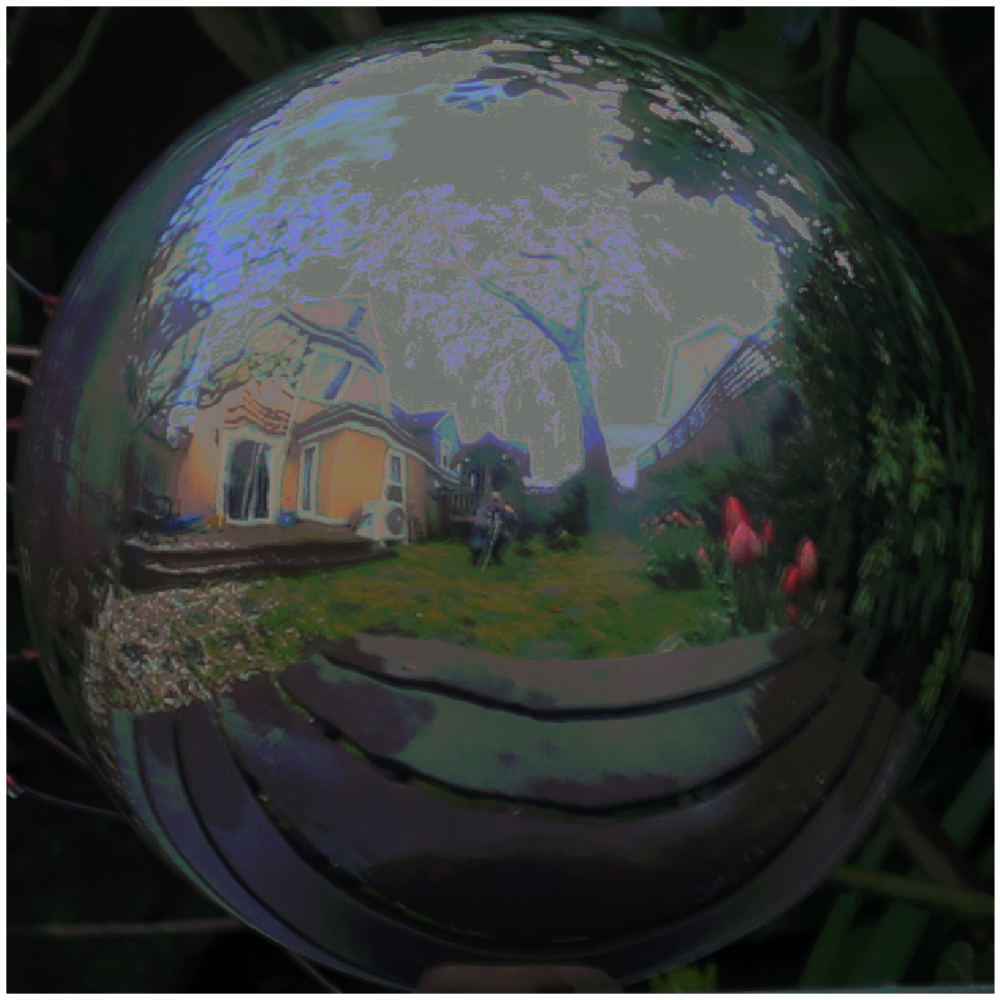

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


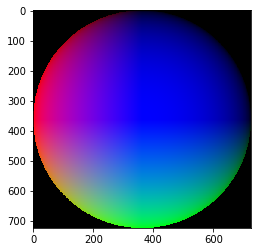

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


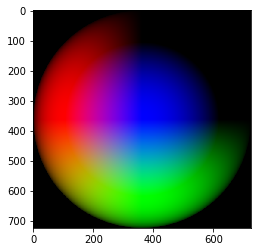

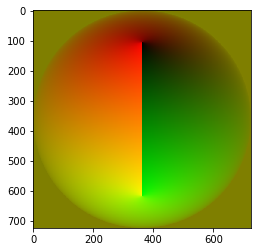

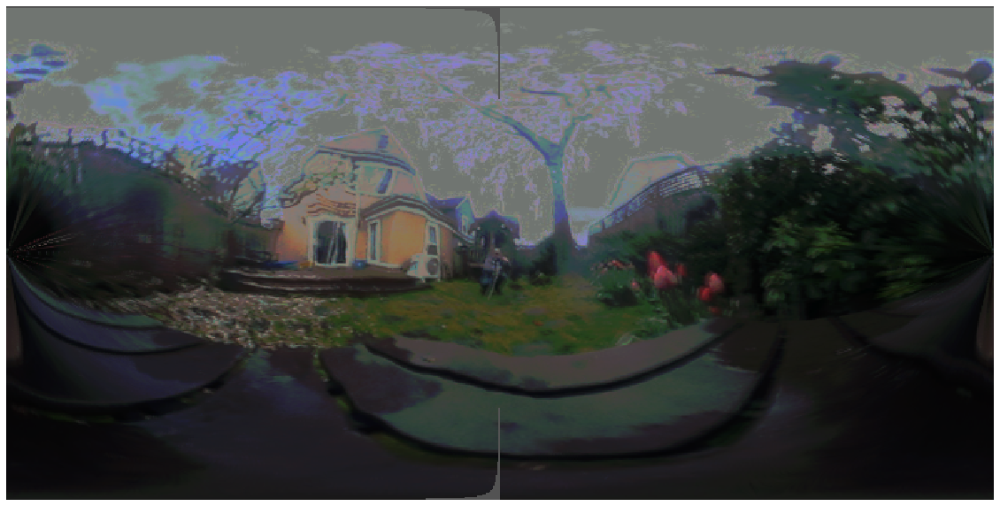

In [9]:

sphere_files2 = ["./bryanmg2_images/probe2_1-100.png",
                 "./bryanmg2_images/probe2_1-25.png",
                 "./bryanmg2_images/probe2_1-6.png"]

ldr_images2 = np.stack([read_image(f) for f in sphere_files2])

exposures2 = np.float32([1. / t for t in [100, 25, 6]])

# get HDR image, log irradiance
estimated_hdr_image2, estimated_log_irradiance2, estimated_g2 = make_hdr_estimation(ldr_images2, exposures2)

#print(estimated_g)


# display HDR image
display_hdr_image(estimated_hdr_image2)
plt.show()

eq_image2 = panoramic_transform(estimated_hdr_image2)
display_hdr_image(eq_image2)
write_hdr_image(eq_image2, 'images/outputs/equirectangular2.hdr')


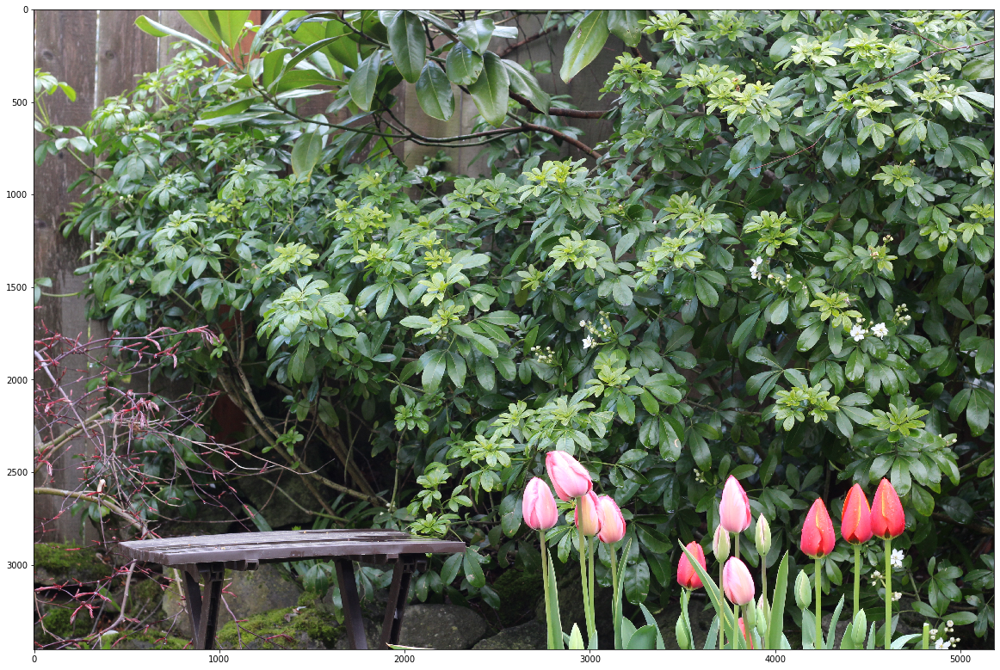

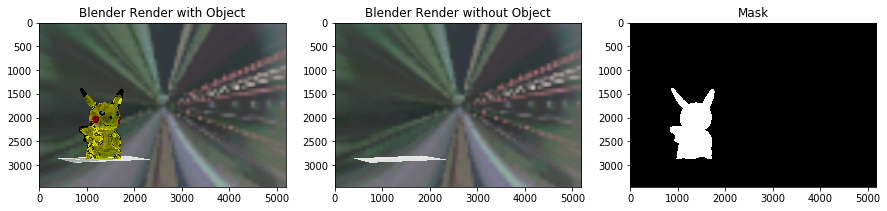

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


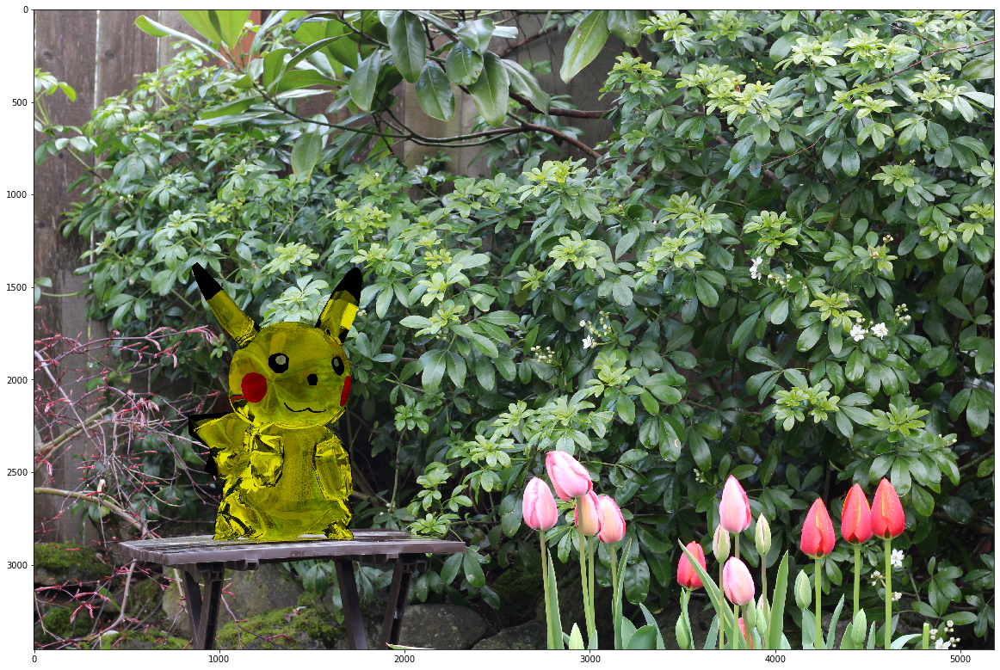

In [12]:
# this part assumes that you have these from Blender.
p2_obj_path = "./bryanmg2_images/p2_obj.png"
p2_no_obj_path = "./bryanmg2_images/p2_no_obj.png"
p2_mask_path = "./bryanmg2_images/p2_mask.png"

bg2_path = "./bryanmg2_images/background2.JPG"

bg2_image = read_image(bg2_path)

plt.figure(figsize = (20,20))
plt.imshow(bg2_image)
plt.show()


R = read_image(p2_obj_path)
E = read_image(p2_no_obj_path)
M = read_image(p2_mask_path)
M = M > 0.5
I = bg2_image

c = 1.0

fig, axes = plt.subplots(1,3, figsize = (15,15))
axes[0].set_title('Blender Render with Object')
axes[0].imshow(R)
axes[1].set_title('Blender Render without Object')
axes[1].imshow(E)
axes[2].set_title('Mask')
axes[2].imshow(M*255)

plt.show()


merged_im2 = M*R + (1-M)*I + (1-M)*(R-E)*c

plt.figure(figsize = (20,20))
plt.imshow(merged_im2)
plt.show()
